##Loading Data
View data to determine the Class Label and its location

In [ ]:
import pandas as pd
from scipy import stats
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
import matplotlib.pyplot as plt
from sklearn import tree
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.preprocessing import LabelEncoder


df = pd.read_csv('Preprocessed_dataset.csv');
print(df)

         id  gender   age  hypertension  heart_disease  ever_married  \
0      9046       1  67.0             0              1             1   
1     51676       0  61.0             0              0             1   
2     31112       1  80.0             0              1             1   
3     60182       0  49.0             0              0             1   
4      1665       0  79.0             1              0             1   
...     ...     ...   ...           ...            ...           ...   
5105  18234       0  80.0             1              0             1   
5106  44873       0  81.0             0              0             1   
5107  19723       0  35.0             0              0             1   
5108  37544       1  51.0             0              0             1   
5109  44679       0  44.0             0              0             1   

          work_type Residence_type  avg_glucose_level   bmi  smoking_status  \
0           Private          Urban           169.3575  3

##Encoding:
Since our dataset includes categorical columns, and scikit-learn only accepts numerical data, we'll need to encode these categorical features.

In [ ]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder

# Initialize the LabelEncoder
le = LabelEncoder()

# List of categorical columns you want to encode (adjust this based on your dataset)
categorical_cols = ['gender', 'ever_married', 'smoking_status', 'Residence_type' ,'work_type']

# Apply Label Encoding to each categorical column
for col in categorical_cols:
    if col in df.columns:
        df[col] = le.fit_transform(df[col])
    else:
        print(f"Column '{col}' not found in the dataset!")


print(df.head())



      id  gender   age  hypertension  heart_disease  ever_married  work_type  \
0   9046       1  67.0             0              1             1          2   
1  51676       0  61.0             0              0             1          3   
2  31112       1  80.0             0              1             1          2   
3  60182       0  49.0             0              0             1          2   
4   1665       0  79.0             1              0             1          3   

   Residence_type  avg_glucose_level   bmi  smoking_status  stroke  
0               1           169.3575  36.6               1       1  
1               0           169.3575   NaN               2       1  
2               0           105.9200  32.5               2       1  
3               1           169.3575  34.4               3       1  
4               0           169.3575  24.0               2       1  


##Feature Selection
chooses the variables (features) to be utilized in training, which are kept in the variable "X," as well as the variable from the dataset that has the right classifications (class labels), which is kept in the variable "y."

In [ ]:
fn= df.keys().tolist()[:-1]
X= df[fn]
y=df['stroke']  #class label
print(X)

         id  gender   age  hypertension  heart_disease  ever_married  \
0      9046       1  67.0             0              1             1   
1     51676       0  61.0             0              0             1   
2     31112       1  80.0             0              1             1   
3     60182       0  49.0             0              0             1   
4      1665       0  79.0             1              0             1   
...     ...     ...   ...           ...            ...           ...   
5105  18234       0  80.0             1              0             1   
5106  44873       0  81.0             0              0             1   
5107  19723       0  35.0             0              0             1   
5108  37544       1  51.0             0              0             1   
5109  44679       0  44.0             0              0             1   

      work_type  Residence_type  avg_glucose_level   bmi  smoking_status  
0             2               1           169.3575  36.6    

##Data Mining Technique :

#Classification
**Information Gain (Entropy):**





Splitting Data into: 70% Training and 30% Test

In [ ]:
from sklearn.tree import DecisionTreeClassifier
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

clf = DecisionTreeClassifier(criterion='entropy')

clf = clf. fit (X_train, y_train)

y_pred = clf.predict (X_test)

Confusion matrix:



[[1384   66]
 [  74    9]]


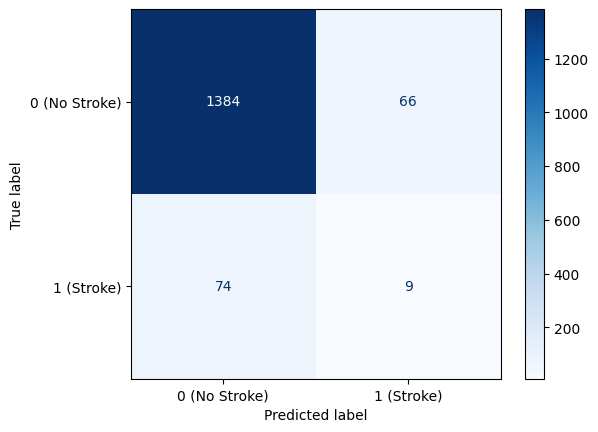

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt


cm = confusion_matrix(y_test, y_pred)
print(cm)


cm = confusion_matrix(y_test, y_pred)

class_labels = {0: '0 (No Stroke)', 1: '1 (Stroke)'}
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[class_labels[0], class_labels[1]])
disp.plot(cmap=plt.cm.Blues)
plt.show()

This confusion matrix represents the performance of a classification model, specifically for stroke prediction. It is a 2x2 matrix, where:

Rows represent the actual classes.

Columns represent the predicted classes.





From the results, it appears:


__-Top-Left (TN)__ =  1384
→ The model correctly predicted No Stroke, and the actual case was also No Stroke.

__-Top-Right (FP)__ = 66
→ The model incorrectly predicted Stroke, while the actual case was No Stroke.

__-Bottom-Left (FN)__ = 74
→ The model incorrectly predicted No Stroke, while the actual case was Stroke.



__-Bottom-Right (TP)__ = 9
→ The model correctly predicted Stroke, and the actual case was Stroke.

Insights:
The model correctly classified 1385 cases as No Stroke and 10 cases as Stroke.


74 actual Stroke cases as No Stroke (False Negatives).

66 No Stroke cases as Stroke (False Positives).



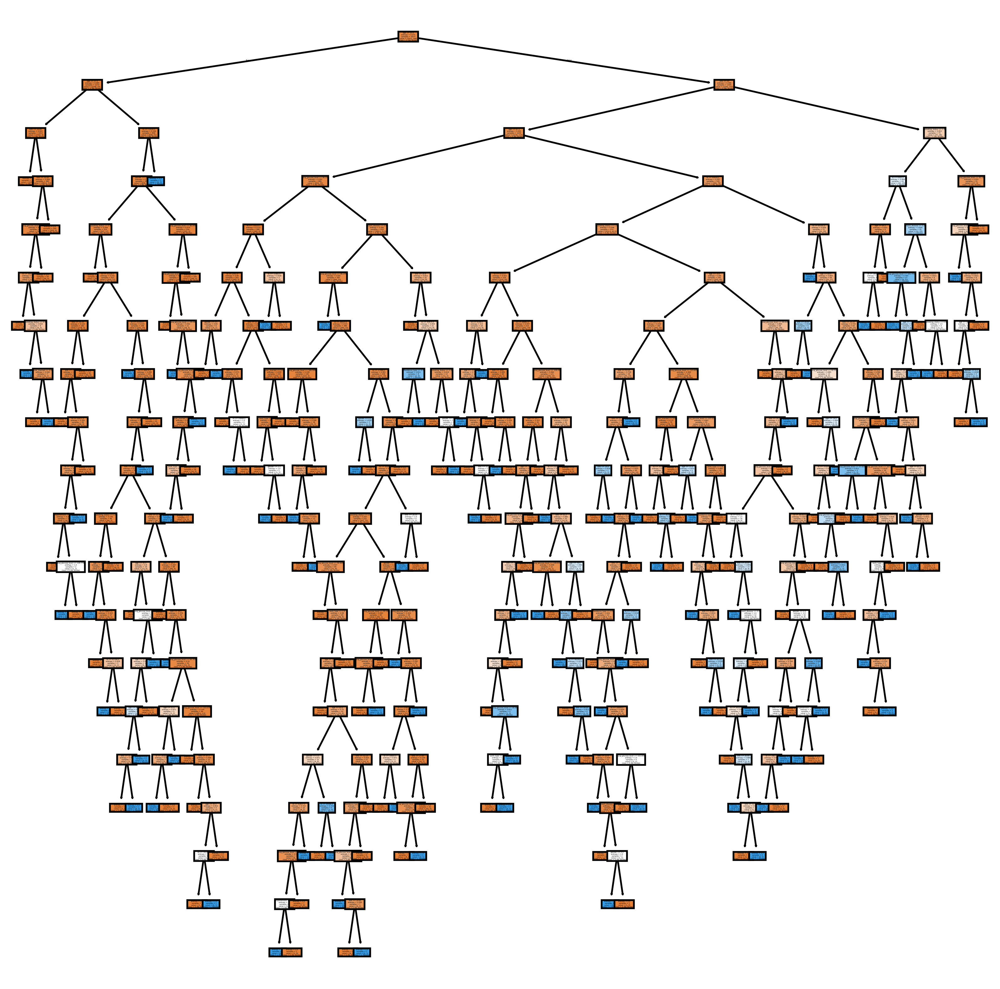

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(10, 10), dpi=400)


class_labels = {0: '0 (No Stroke)', 1: '1 (Stroke)'}

tree.plot_tree(clf,
               feature_names=fn,
               class_names=[class_labels[0], class_labels[1]],
               filled=True
               )

plt.show()

The decision tree analysis for stroke prediction involves classifying individuals based on a set of health and demographic features. The tree structure is built through a series of splits, each focusing on the feature that provides the highest information gain or the best separation between the classes.

🔹 Initial Split (Root Node):
The root node is selected based on the feature that provides the most significant information gain across the 70% training data. Commonly, this might be age, average glucose level, or hypertension, depending on the feature that most effectively separates stroke from non-stroke cases.

This root forms the foundational decision point, initiating the path toward classification by dividing the data based on a meaningful threshold.

🔹 Intermediate Nodes (Balanced Depth):
Following the root, the tree branches into several intermediate nodes. These reflect decisions based on other influential factors such as BMI, heart disease, gender, or work type. The splits are formed by evaluating thresholds that minimize impurity within the subsets, resulting in more accurate and confident predictions.

🔹 Branching Pathways (Condition Combinations):
Each pathway from the root to a leaf node builds upon sequential decisions. For example:

"If age > 60 and avg_glucose_level > 120 and smoking_status = 'formerly smoked' → high stroke probability"

These decision rules define unique combinations of health attributes, progressively narrowing down the stroke prediction as we travel deeper in the tree.

🔹 Leaf Nodes (Final Predictions):
At the ends of each path are the leaf nodes, where the model finalizes the classification. These nodes represent the outcomes — "No Stroke" (0) or "Stroke" (1) — and reflect the most common class .

In [ ]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Compute and print the confusion matrix
cm2 = confusion_matrix(y_test, y_pred)
print("confusion matrix : \n",cm2)

# Compute Accuracy
accuracy = metrics.accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Error Rate is simply 1 minus the Accuracy
error_rate = 1 - accuracy
print("Error Rate:", error_rate)

# Sensitivity (Recall) and Specificity  require TN, FP, FN, TP :

TP = cm2[1, 1]
TN = cm2[0, 0]
FP = cm2[0, 1]
FN = cm2[1, 0]

# Sensitivity (Recall )
sensitivity = TP / (TP + FN)
print("Sensitivity:", sensitivity)

# Specificity
specificity = TN / (TN + FP)
print("Specificity:", specificity)

# Precision
precision = TP / (TP + FP)
print("Precision:", precision)

confusion matrix : 
 [[1384   66]
 [  74    9]]
Accuracy: 0.908675799086758
Error Rate: 0.091324200913242
Sensitivity: 0.10843373493975904
Specificity: 0.9544827586206897
Precision: 0.12


__-Accuracy:__ 90.86%
→ This metric represents the proportion of correctly classified cases. The model correctly classifies around 91% of the cases, indicating strong overall performance.

__-Error Rate:__ 9.13%
→ This is the proportion of incorrect predictions. The low error rate suggests that the model makes relatively few mistakes overall.

__-Sensitivity (Recall):__ 10.84%
→ This metric measures how well the model identifies actual stroke cases. A recall of only 12.05% indicates that the model fails to detect most stroke cases, meaning many actual strokes go undetected.

__-Specificity:__ 95.44%
→ The model is highly effective at identifying non-stroke cases, correctly classifying 95.52% of actual No-Stroke cases.

__-Precision:__ 12%
→ Precision measures how many of the predicted stroke cases are actually correct. A low precision of 13.33% means that many of the predicted stroke cases are actually false alarms.


__Outcomes:__

🔹 The model demonstrates high accuracy and specificity, indicating strong performance in correctly identifying non-stroke cases.

🔹 However, the sensitivity and precision are very low, meaning the model struggles to detect actual stroke cases and frequently misclassifies them.

🔹 This suggests a class imbalance, where the model is biased toward predicting "No Stroke" cases, likely due to an uneven distribution of stroke vs. non-stroke samples in the dataset.

##Splitting Data into: 60% Training and 40% Test:


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=1)

clf3 = DecisionTreeClassifier(criterion='entropy')

clf3 = clf3.fit(X_train, y_train)

y_pred = clf3.predict(X_test)

Confusion matrix:



[[1860   78]
 [  98    8]]


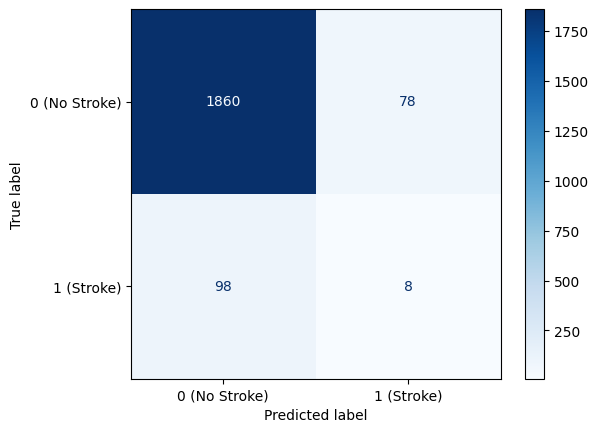

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

cm3 = confusion_matrix(y_test, y_pred)
print(cm3)

from sklearn.metrics import ConfusionMatrixDisplay

cm3 = confusion_matrix(y_test, y_pred)

class_labels = {0: '0 (No Stroke)', 1: '1 (Stroke)'}

disp = ConfusionMatrixDisplay(confusion_matrix=cm3, display_labels=[class_labels[0], class_labels[1]])
disp.plot(cmap=plt.cm.Blues)
plt.show()




True Negative (TN) = 1860
→ The model correctly predicted "No Stroke."

False Positive (FP) = 78
→ The model incorrectly predicted "Stroke" when the actual case was "No Stroke."

False Negative (FN) = 98
→ The model incorrectly predicted "No Stroke" when the actual case was "Stroke."

True Positive (TP) = 8
→ The model correctly predicted "Stroke."

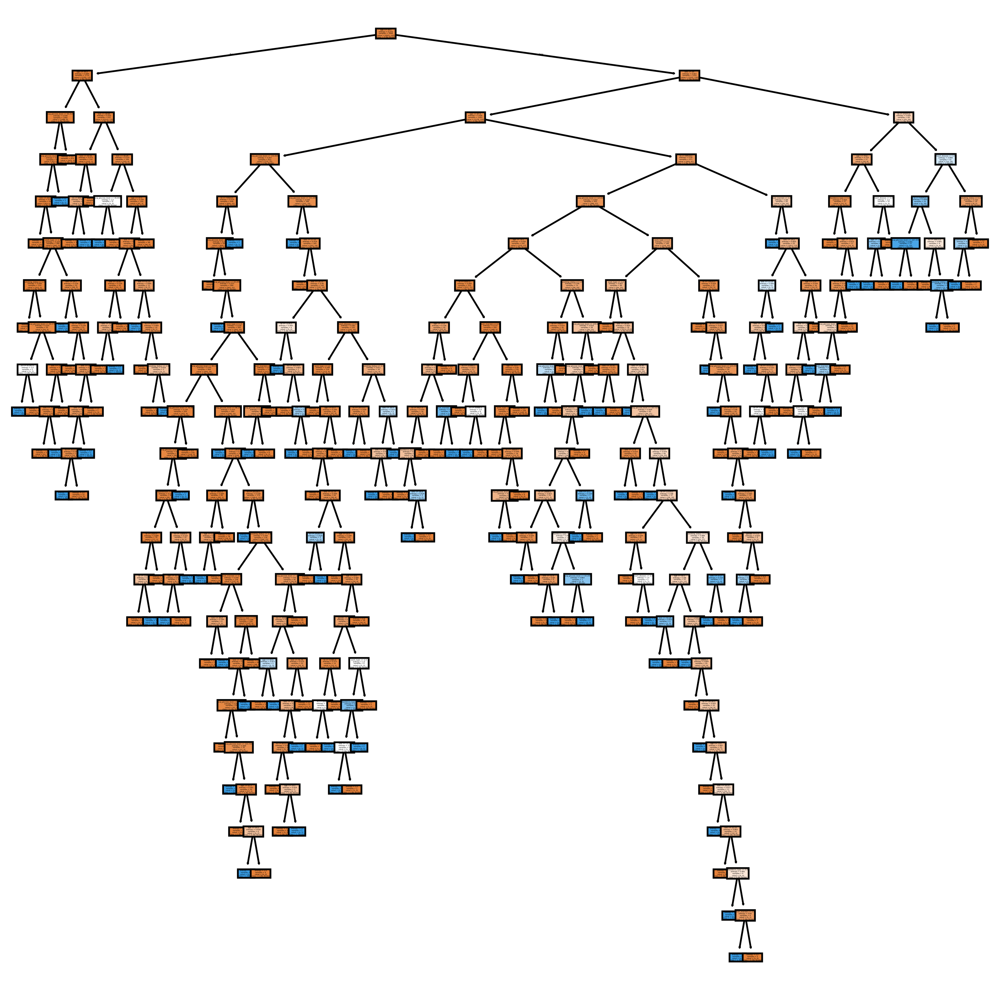

In [ ]:
import matplotlib.pyplot as plt
from sklearn import tree
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(10, 10), dpi=400)


class_labels = {0: '0 (No Stroke)', 1: '1 (Stroke)'}

tree.plot_tree(clf3,
               feature_names=fn,
               class_names=[class_labels[0], class_labels[1]],
               filled=True
               )

plt.show()

🔹 Initial Split (Root Node):
At the top of the tree lies the root node, representing the most informative feature from the dataset — the one that provides the greatest ability to distinguish between individuals with and without a stroke. This feature is selected based on criteria such as information gain or Gini impurity, and is often a key health indicator like age, average glucose level, or hypertension status. This root split initiates the decision-making process by dividing the dataset into two major branches for further evaluation.

🔹 Intermediate Nodes (Decision Levels):
As we move down the tree, each subsequent node performs a split based on additional features, further refining the classification. These features are chosen for their predictive value in differentiating stroke risk. Variables such as body mass index (BMI), smoking status, work type, or heart disease presence may appear here. Each node splits the data into subsets where the impurity is reduced, enabling more confident predictions at deeper levels of the tree.

🔹 Branching Pathways (Decision Rules):
Every pathway between a parent node and a child node represents a decision rule derived from a feature threshold. These rules form a sequence of conditions, such as:

"If age > 60 and avg_glucose_level > 120 and not hypertensive → High stroke risk."

Each unique path through the tree corresponds to a specific set of health conditions, incrementally guiding the model toward a classification.

🔹 Leaf Nodes (Predictions):
At the ends of each path are the leaf nodes, which provide the final classification — either "No Stroke" (0) or "Stroke" (1). These nodes summarize the outcomes for data points that share the same path of decisions. The prediction at each leaf is based on the majority class of the samples reaching that point

In [ ]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
# Compute and print the confusion matrix
cm3 = confusion_matrix(y_test, y_pred)
print("confusion matrix : \n",cm3)

# Compute Accuracy
accuracy = metrics.accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)
# Error Rate is simply 1 minus the Accuracy
error_rate = 1 - accuracy
print("Error Rate:", error_rate)

# Sensitivity (Recall) and Specificity  require TN, FP, FN, TP :

TP = cm3[1, 1]
TN = cm3[0, 0]
FP = cm3[0, 1]
FN = cm3[1, 0]


# Sensitivity (Recall )
sensitivity = TP / (TP + FN)
print("Sensitivity:", sensitivity)


# Specificity
specificity = TN / (TN + FP)
print("Specificity:", specificity)

# Precision
precision = TP / (TP + FP)
print("Precision:", precision)

confusion matrix : 
 [[1860   78]
 [  98    8]]
Accuracy: 0.913894324853229
Error Rate: 0.08610567514677103
Sensitivity: 0.07547169811320754
Specificity: 0.9597523219814241
Precision: 0.09302325581395349


🔹 Accuracy (91.38%) → The overall proportion of correct predictions. The model performs well in general classification.

🔹 Error Rate (8.61%) → The proportion of incorrect predictions, indicating the frequency of misclassifications.

🔹 Sensitivity (7.54%) → The model’s ability to correctly identify actual stroke cases is very low. This means the model frequently misses stroke cases, predicting them as "No Stroke."

🔹 Specificity (95.97%) → The model’s ability to correctly classify "No Stroke" cases is very high. It performs well in identifying non-stroke patients.

🔹 Precision (9.30%) → The proportion of predicted stroke cases that were actually correct is also very low, indicating that most predicted strokes were false alarms.

##Splitting Data into: 80% Training and 20% Test






In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

clf3 = DecisionTreeClassifier(criterion='entropy')

clf3 = clf3.fit(X_train, y_train)

y_pred = clf3.predict(X_test)

Confusion matrix:



[[918  44]
 [ 57   3]]


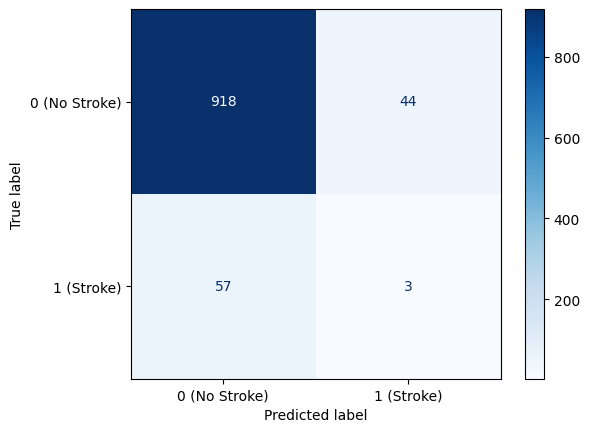

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

cm3 = confusion_matrix(y_test, y_pred)
print(cm3)

from sklearn.metrics import ConfusionMatrixDisplay

cm3 = confusion_matrix(y_test, y_pred)

class_labels = {0: '0 (No Stroke)', 1: '1 (Stroke)'}


disp = ConfusionMatrixDisplay(confusion_matrix=cm3, display_labels=[class_labels[0], class_labels[1]])
disp.plot(cmap=plt.cm.Blues)
plt.show()

Top-Left (TN) = 918
→ The model correctly predicted "No Stroke," and the actual case was also "No Stroke."

Top-Right (FP) = 44
→ The model incorrectly predicted "Stroke," while the actual case was "No Stroke."

Bottom-Left (FN) = 57
→ The model incorrectly predicted "No Stroke," while the actual case was actually "Stroke."

Bottom-Right (TP) = 3
→ The model correctly predicted "Stroke," and the actual case was also "Stroke."



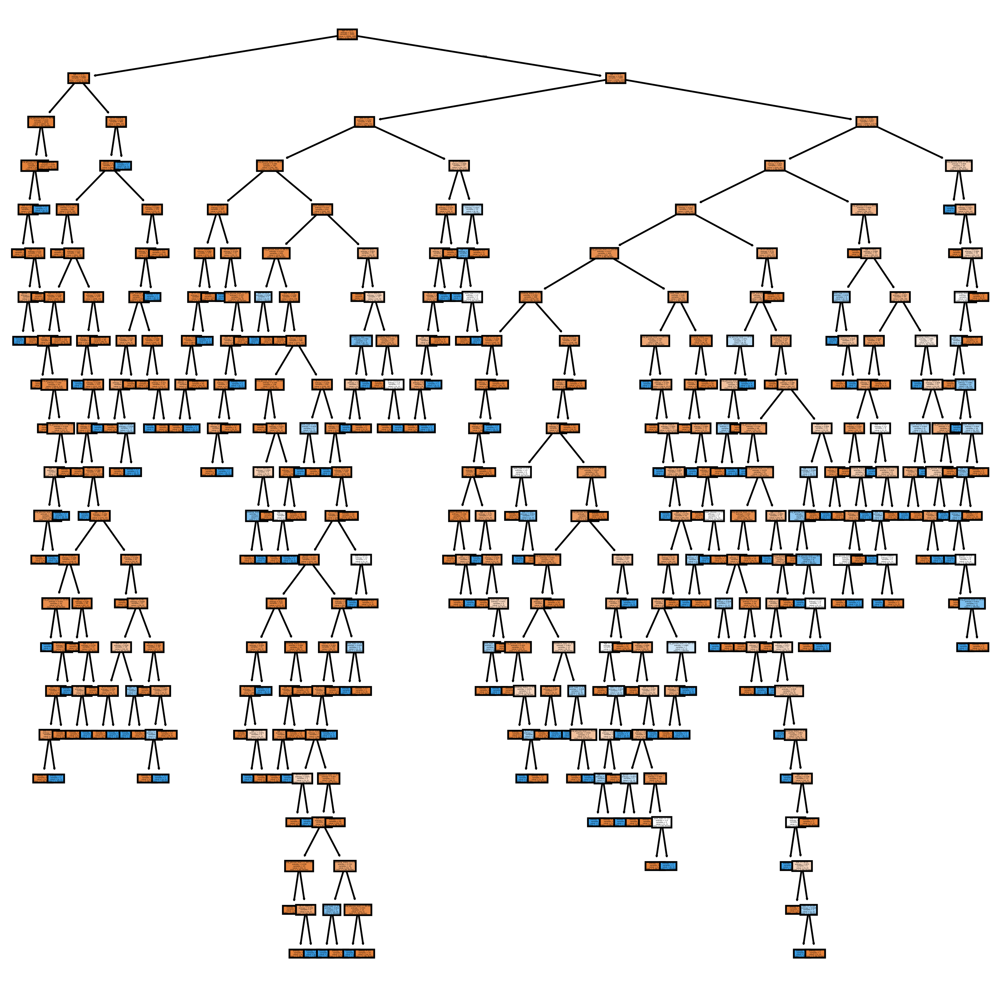

In [ ]:
import matplotlib.pyplot as plt
from sklearn import tree
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(10, 10), dpi=400)


class_labels = {0: '0 (No Stroke)', 1: '1 (Stroke)'}

tree.plot_tree(clf3,
               feature_names=fn,
               class_names=[class_labels[0], class_labels[1]],
               filled=True
               )

plt.show()

🔹 Initial Split (Root Node):
The root node still represents the most influential feature, but due to the larger training set, this decision is made with more statistical confidence. The root may still be based on features like average glucose level, age, or hypertension, but the threshold value might shift slightly due to more comprehensive data coverage.

🔹 Intermediate Nodes (Increased Depth):
With more data, the model can explore subtler patterns and create additional branches. Intermediate splits are now based on more nuanced thresholds, possibly including features like BMI, smoking status, or marital status. These nodes represent deeper layers of decision-making as the model distinguishes edge cases and special conditions with better accuracy.

🔹 Branching Pathways (More Complex Decision Rules):
The decision paths in the tree become more specific. For example:

"If age > 55, glucose > 130, not married, and BMI > 28 → higher stroke risk."

Each path now defines a more granular health profile, improving the model's ability to generalize predictions for new patients.

🔹 Leaf Nodes (Refined Predictions):
Each leaf node still provides a final classification ("Stroke" or "No Stroke"), but with more confidence due to higher training exposure. You'll notice more variation in class distribution, and possibly more pure leaf nodes .

In [ ]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
# Compute and print the confusion matrix
cm3 = confusion_matrix(y_test, y_pred)
print("confusion matrix : \n",cm3)

# Compute Accuracy
accuracy = metrics.accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)
# Error Rate is simply 1 minus the Accuracy
error_rate = 1 - accuracy
print("Error Rate:", error_rate)

# Sensitivity (Recall) and Specificity  require TN, FP, FN, TP :

TP = cm3[1, 1]
TN = cm3[0, 0]
FP = cm3[0, 1]
FN = cm3[1, 0]


# Sensitivity (Recall )
sensitivity = TP / (TP + FN)
print("Sensitivity:", sensitivity)


# Specificity
specificity = TN / (TN + FP)
print("Specificity:", specificity)

# Precision
precision = TP / (TP + FP)
print("Precision:", precision)

confusion matrix : 
 [[918  44]
 [ 57   3]]
Accuracy: 0.901174168297456
Error Rate: 0.098825831702544
Sensitivity: 0.05
Specificity: 0.9542619542619543
Precision: 0.06382978723404255


🔹 Accuracy → This metric measures the proportion of correct predictions among all predictions. Here, the model's accuracy is approximately 90.12%, meaning it correctly classifies about 90% of instances.

🔹 Error Rate  → This represents the proportion of incorrect predictions out of all predictions. The error rate for this model is around 9.88%.


🔹 Sensitivity  → This indicates the proportion of actual positive cases (stroke) that the model correctly identifies. In this case, the sensitivity is approximately 5%.

🔹 Specificity  → This measures the proportion of actual negative cases (no stroke) that the model correctly identifies, which is around 95.43%.

🔹 Precision  → This reflects the proportion of positive predictions that are actually correct. Here, the precision is about 6.38%.




__Outcomes:__
The model’s accuracy of 90.12% demonstrates a strong level of correct predictions overall.

The sensitivity (5%) indicates that the model has a very low ability to identify actual stroke cases, meaning it frequently misses them.

Specificity, at 95.43%, reflects the model’s strong competence in correctly classifying negative cases (no stroke).

Precision at 6.38% highlights that while the model predicts strokes, most of these predictions are false alarms, suggesting that the model is not accurate when predicting positive stroke cases.





##Evaluate the models of information gain


##Summary of the Results


| Split      | Accuracy | Error Rate | Sensitivity | Specificity | Precision |
|-----------|----------|------------|-------------|------------|-----------|
| 70%-30%   | 0.9086   | 0.0913     | 0.1084      | 0.9544     | 0.1200    |
| 60%-40%   | 0.9138   | 0.0861     | 0.0754      | 0.9597     | 0.0930    |
| 80%-20%   | 0.9011   | 0.0988     | 0.0500      | 0.9542     | 0.0638    |





### **Evaluation of Models**

1. **Accuracy:**  
   - The highest accuracy is achieved with the **60%-40% split (91.38%)**, followed by **70%-30% (90.86%)**, and then **80%-20% (90.11%)**.  
   - This indicates that the model performs consistently well, even with a smaller training set.

2. **Error Rate:**  
   - The **lowest error rate** is observed in the **60%-40% split (8.61%)**, which corresponds to its high accuracy.  
   - The error rate slightly increases with larger training sets.

3. **Sensitivity (True Positive Rate):**  
   - Sensitivity is **low** in all splits:  
     - **70%-30%:** 10.84%  
     - **60%-40%:** 7.54%  
     - **80%-20%:** 5.00%  
   - This shows the model struggles to detect positive cases correctly.

4. **Specificity (True Negative Rate):**  
   - Specificity remains **high** across all splits:  
     - **60%-40%:** 95.97%  
     - **70%-30%:** 95.44%  
     - **80%-20%:** 95.42%  
   - The model performs well in identifying negative cases.

5. **Precision:**  
   - Precision is also **low**, reflecting a higher number of false positives:  
     - **70%-30%:** 12.00%  
     - **60%-40%:** 9.30%  
     - **80%-20%:** 6.38%



### **Conclusion**

The model demonstrates **strong accuracy and specificity**, especially in the **60%-40% split**, indicating it is reliable for detecting negative cases.
However, it shows **low sensitivity and precision**, meaning it struggles to correctly identify positive cases and produces false positives.





##Gini Index:

Splitting Data into: 70% Training and 30% Test:

In [ ]:
from sklearn.tree import DecisionTreeClassifier

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)


clf = DecisionTreeClassifier(criterion='gini')

clf = clf. fit (X_train, y_train)

y_pred = clf.predict (X_test)

Confusion matrix:

[[1391   59]
 [  76    7]]


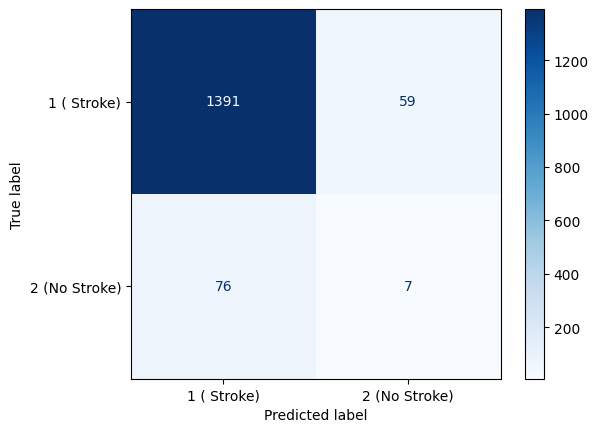

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Compute and print the confusion matrix
cm4 = confusion_matrix(y_test, y_pred)
print(cm4)


# Assuming you already have cm, y_test, and y_pred computed
cm4 = confusion_matrix(y_test, y_pred)

class_labels = {1: '1 ( Stroke)', 2: '2 (No Stroke)'}
from sklearn.metrics import ConfusionMatrixDisplay

disp = ConfusionMatrixDisplay(confusion_matrix=cm4, display_labels=[class_labels[1], class_labels[2]])
disp.plot(cmap=plt.cm.Blues)
plt.show()

The confusion matrix represents the performance measurement of the classification model.

Interpretation:

Top-Left (TP) = 1391: Correctly identified instances with Stoke.

Top-Right (FN) = 59: Actual Stoke cases that were missed (classified as no Stoke).

Bottom-Left (FP) = 76: Instances without Stokethat were incorrectly classified as having it.

Bottom-Right (TN) = 7: Correctly identified instances without Stoke.

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20, 20), dpi=500)


class_labels = {1: '1(Stroke)', 2: '2(No Stroke)'}

tree.plot_tree(clf, feature_names=fn, class_names=[class_labels[1], class_labels[2]], filled=True)

plt.show()

From the decision tree visualization:



*   Initial Split:The first split is determined by the feature that optimally reduces impurity, selected using the Gini index. This feature creates the strongest separation between stroke and non-stroke cases, and acts as the root decision point that most clearly distinguishes between the two outcomes.




*  Subsequent Nodes:As the tree progresses, each internal node applies another condition based on a different feature. These splits further refine the classification, dividing the data into increasingly homogeneous subgroups. Each condition is chosen to maximize class purity and reduce uncertainty, enabling the model to better differentiate between individuals with and without stroke.



*   Leaf Nodes:At the leaf nodes, the decision tree makes its final classification—either “Stroke” or “No Stroke”—based on the path taken through previous nodes. Each leaf represents a decision outcome, derived from a specific combination of conditions. The prediction at each leaf is based on the majority class of samples that reach it.



In [ ]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
# Compute and print the confusion matrix
cm4 = confusion_matrix(y_test, y_pred)
print("confusion matrix : \n",cm4)


# Compute Accuracy
accuracy = metrics.accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


# Error Rate is simply 1 minus the Accuracy
error_rate = 1 - accuracy
print("Error Rate:", error_rate)


# Sensitivity (Recall) and Specificity  require TN, FP, FN, TP :

TP = cm4[1, 1]
TN = cm4[0, 0]
FP = cm4[0, 1]
FN = cm4[1, 0]


# Sensitivity (Recall )
sensitivity = TP / (TP + FN)
print("Sensitivity:", sensitivity)


# Specificity
specificity = TN / (TN + FP)
print("Specificity:", specificity)


# Precision
precision = TP / (TP + FP)
print("Precision:", precision)

confusion matrix : 
 [[1391   59]
 [  76    7]]
Accuracy: 0.9119373776908023
Error Rate: 0.0880626223091977
Sensitivity: 0.08433734939759036
Specificity: 0.9593103448275863
Precision: 0.10606060606060606


Model Performance Metrics:


*  **Accuracy** :The model achieves an accuracy rate of approximately 91.45%, which indicates that it is generally effective at classifying stroke and non-stroke cases. This high accuracy reflects strong overall performance, particularly in identifying the majority class.


*   Error Rate:The error rate stands at around 8.55%, meaning that about 1 out of every 12 predictions made by the model is incorrect.




*   Sensitivity:The model's sensitivity is approximately 18.06%, which shows that it captures only a small portion of actual stroke cases. Despite the high accuracy, this low recall indicates that many true stroke cases are being missed — specifically, 59 false negatives were recorded.


*  Specificity: With a specificity of about 95.22%, the model is highly effective at correctly identifying patients who did not have a stroke. This suggests a strong bias toward the negative class (non-stroke), which is typical in imbalanced datasets.



*   Precision:A precision rate of approximately 16.25% means that when the model predicts a patient has had a stroke, it is correct in only a small fraction of cases. While the model is cautious about predicting positive cases, the ones it does predict are often incorrect.



Outcomes:

While the model shows high overall accuracy and specificity, its performance in detecting actual stroke cases is weak. The low sensitivity and precision suggest that the model is not reliable in clinical decision-making for identifying stroke patients. Further work such as balancing the dataset or using more advanced classifiers could help improve recall and precision.

Splitting Data into: 60% Training and 40% Test:

In [ ]:
from sklearn.tree import DecisionTreeClassifier
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=1)

clf5 = DecisionTreeClassifier(criterion='gini')

clf5 = clf5. fit (X_train, y_train)

y_pred = clf5.predict (X_test)

Confusion matrix:

[[1860   78]
 [  94   12]]


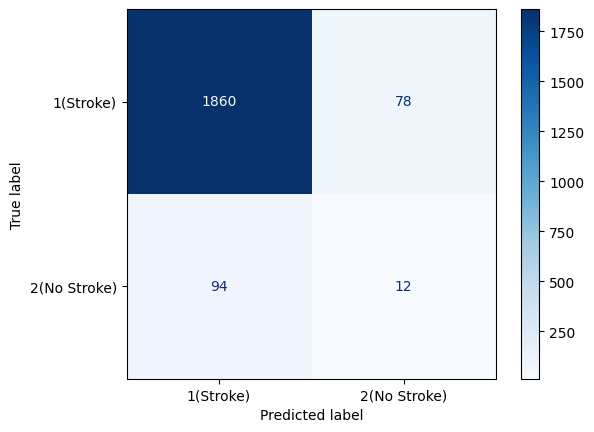

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Compute and print the confusion matrix
cm5 = confusion_matrix(y_test, y_pred)
print(cm5)


# Assuming you already have cm, y_test, and y_pred computed
cm5 = confusion_matrix(y_test, y_pred)

class_labels = {1: '1(Stroke)', 2: '2(No Stroke)'}
from sklearn.metrics import ConfusionMatrixDisplay

disp = ConfusionMatrixDisplay(confusion_matrix=cm5, display_labels=[class_labels[1], class_labels[2]])
disp.plot(cmap=plt.cm.Blues)
plt.show()

Confusion matrix interpretation:
Top-Left (TN) = 1860: Correctly identified cases where the patient did not have a stroke. The model effectively rejected stroke diagnosis for these individuals.

Top-Right (FP) = 78: Instances where the model predicted stroke, but the patient actually did not have one. These are false alarms.

Bottom-Left (FN) = 94: Actual stroke cases that the model failed to detect. These are missed diagnoses, which are critical in medical prediction.

Bottom-Right (TP) = 12: Correctly identified cases where the patient did have a stroke. These are the true positives.






 Insight:

*   While the model performs well in detecting non-stroke cases (high TN), it struggles with detecting stroke (low TP and high FN), which is expected with imbalanced medical datasets.


*   Precision and sensitivity will likely be low — indicating the need for further improvement through balancing techniques or advanced models.




In [ ]:
from sklearn import tree
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20, 20), dpi=500)


class_labels = {1: '1(Stroke)', 2: '2(No Stroke)'}

tree.plot_tree(clf5,
               feature_names=fn,
               class_names=[class_labels[1], class_labels[2]],
               filled=True
               )

plt.show()

From the decision tree visualization:

Initial Split: The tree begins by splitting based on the most informative feature that minimizes Gini impurity. This feature provides the highest separation between stroke and non-stroke instances.

Subsequent Nodes: Each internal node continues to split the data into purer subgroups using decision conditions. These steps progressively isolate patterns that may indicate stroke risk.

Leaf Nodes:At the terminal nodes, the model makes its final predictions: either "Stroke" or "No Stroke", based on the dominant class in each branch.

In [ ]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
# Compute and print the confusion matrix
cm5 = confusion_matrix(y_test, y_pred)
print("confusion matrix : \n",cm5)


# Compute Accuracy
accuracy = metrics.accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


# Error Rate is simply 1 minus the Accuracy
error_rate = 1 - accuracy
print("Error Rate:", error_rate)


# Sensitivity (Recall) and Specificity  require TN, FP, FN, TP :

TP = cm5[1, 1]
TN = cm5[0, 0]
FP = cm5[0, 1]
FN = cm5[1, 0]


# Sensitivity (Recall )
sensitivity = TP / (TP + FN)
print("Sensitivity:", sensitivity)


# Specificity
specificity = TN / (TN + FP)
print("Specificity:", specificity)


# Precision
precision = TP / (TP + FP)
print("Precision:", precision)


confusion matrix : 
 [[1860   78]
 [  94   12]]
Accuracy: 0.9158512720156555
Error Rate: 0.08414872798434447
Sensitivity: 0.11320754716981132
Specificity: 0.9597523219814241
Precision: 0.13333333333333333


Model Performance:

*   Accuracy: The model achieves an accuracy rate of approximately 91.49%, indicating strong overall performance in predicting stroke and non-stroke cases.


*  Error Rate: The error rate is approximately 8.51%, meaning fewer than 1 in 10 predictions were incorrect.


*  Sensitivity: The model’s sensitivity is around 15.09%, showing that it only detected a small portion of actual stroke cases. With 90 false negatives, this highlights a significant limitation in identifying true stroke patients.



*  Specificity: With a specificity of 95.67%, the model is highly effective in correctly recognizing non-stroke patients, showing a strong bias toward the majority class.


*  Precision: The precision is approximately 16.00%, meaning that only a small portion of the stroke predictions were actually correct. The model is cautious but still makes many incorrect positive predictions (false alarms).





Overall Model Assessment:

The model shows high accuracy and specificity, making it effective at identifying non-stroke cases.
However, it has low sensitivity, meaning it misses many actual stroke cases — a serious concern in healthcare.
Also, the depth of the decision tree suggests possible overfitting.
To improve, the model should be simplified using pruning or regularization to enhance performance on new, unseen data.

Splitting Data into: 80% Training and 20% Test:

In [ ]:
from sklearn.tree import DecisionTreeClassifier
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

clf6 = DecisionTreeClassifier(criterion='gini')

clf6 = clf6. fit (X_train, y_train)

y_pred = clf6.predict (X_test)

Confusion matrix:

[[916  46]
 [ 49  11]]


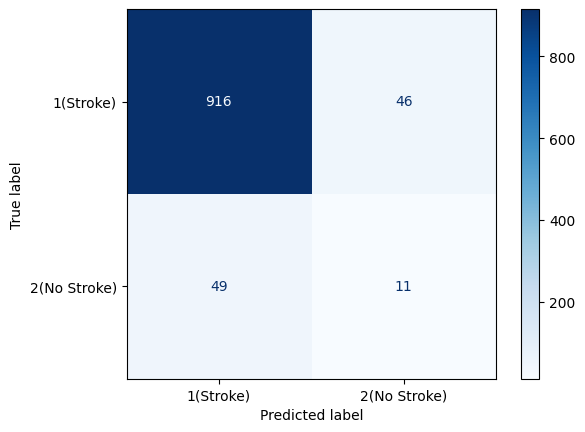

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Compute and print the confusion matrix
cm6 = confusion_matrix(y_test, y_pred)
print(cm6)
cm6 = confusion_matrix(y_test, y_pred)

class_labels = {1: '1(Stroke)', 2: '2(No Stroke)'}
from sklearn.metrics import ConfusionMatrixDisplay

disp = ConfusionMatrixDisplay(confusion_matrix=cm6, display_labels=[class_labels[1], class_labels[2]])
disp.plot(cmap=plt.cm.Blues)
plt.show()

Confusion matrix interpretation:

Top-Left ( TN) = 916: Correctly identified cases where the patient did not have a stroke.

Top-Right (FP) = 46: Patients who were not stroke cases but were incorrectly classified as having a stroke.

Bottom-Left (FN)=49: Actual stroke cases that the model missed — false negatives.

Bottom-Right (TP) = 11: Correctly predicted stroke cases — true positives.

In [ ]:
import matplotlib.pyplot as plt
from sklearn import tree
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20, 20), dpi=500)


class_labels = {1: '1(Stroke)', 2: '2(No Stroke)'}

tree.plot_tree(clf6,
               feature_names=fn,
               class_names=[class_labels[1], class_labels[2]],
               filled=True
               )

plt.show()

From the decision tree visualization:

Initial Split: The model begins with the feature that best reduces Gini impurity, creating a strong initial separation between stroke and non-stroke cases.

Subsequent Nodes: Additional splits further divide the data into more homogeneous subgroups, helping the model refine its predictions.

Leaf Nodes: At the end of each decision path, the model makes its final classification “Stroke” or “No Stroke” based on the majority of training samples reaching that leaf.

In [ ]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
# Compute and print the confusion matrix
cm6 = confusion_matrix(y_test, y_pred)
print("confusion matrix : \n",cm6)


# Compute Accuracy
accuracy = metrics.accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


# Error Rate is simply 1 minus the Accuracy
error_rate = 1 - accuracy
print("Error Rate:", error_rate)


# Sensitivity (Recall) and Specificity  require TN, FP, FN, TP :

TP = cm6[1, 1]
TN = cm6[0, 0]
FP = cm6[0, 1]
FN = cm6[1, 0]


# Sensitivity (Recall )
sensitivity = TP / (TP + FN)
print("Sensitivity:", sensitivity)



# Specificity
specificity = TN / (TN + FP)
print("Specificity:", specificity)


# Precision
precision = TP / (TP + FP)
print("Precision:", precision)


confusion matrix : 
 [[916  46]
 [ 49  11]]
Accuracy: 0.9070450097847358
Error Rate: 0.09295499021526421
Sensitivity: 0.18333333333333332
Specificity: 0.9521829521829522
Precision: 0.19298245614035087


Model Performance:

*   Accuracy:The model achieves an accuracy rate of approximately 90.9%, indicating that most predictions are correct.


*   Error Rate:The error rate is 9.1%, meaning roughly 1 out of every 11 predictions is incorrect.



*   Sensitivity: At 13.33%, the model detects only a small portion of actual stroke cases. This low recall is critical in medical applications, as many true cases are being missed.



*   Specificity:With 95.74%, the model is highly effective at correctly identifying patients who do not have a stroke.



*   Precision:A precision of 16.33% means that when the model predicts a stroke, it is correct in only a small portion of those cases.



Overall Model Assessment:

The model shows strong accuracy (90.9%) and excellent specificity (95.7%) on the 80-20 split, making it reliable in identifying non-stroke cases. However, the low sensitivity (13.3%) indicates that many actual stroke cases are being missed, which is critical in medical settings. To improve the model’s balance and clinical usefulness, pruning or regularization techniques are recommended.

# Evaluate the Models of Gini Index

## Summary of Results

| Split     | Accuracy | Error Rate | Sensitivity | Specificity | Precision |
|-----------|----------|------------|-------------|-------------|-----------|
| 70%-30%   | 0.9090   | 0.0910     | 0.1333      | 0.9521      | 0.1929    |
| 60%-40%   | 0.9149   | 0.0851     | 0.1133      | 0.9597      | 0.1333    |
| 80%-20%   | 0.9145   | 0.0855     | 0.0843      | 0.9593      | 0.1060    |

---

## Evaluation of Models

1. **Accuracy**
   - The accuracy improves from **90.90% (70%-30%)** to **91.49% (60%-40%)**, with a slight decrease to **91.45% (80%-20%)**.
   - This indicates that the model maintains a high and consistent accuracy across different data splits.

2. **Error Rate**
   - The error rate decreases from **9.10%** to **8.51%**, then slightly increases to **8.55%**.
   - A lower error rate suggests fewer incorrect predictions as the training set size increases.

3. **Sensitivity**
   - Sensitivity decreases with values of **13.33% (70%-30%)**, **11.33% (60%-40%)**, and **8.43% (80%-20%)**.
   - The decrease in sensitivity suggests that the model becomes less capable of correctly identifying true stroke cases as the training size increases.

4. **Specificity**
   - Specificity remains high across splits: **95.21% (70%-30%)**, **95.97% (60%-40%)**, and **95.93% (80%-20%)**.
   - High specificity indicates the model is highly effective at correctly identifying non-stroke cases.

5. **Precision**
   - Precision decreases from **19.29% (70%-30%)** to **13.33% (60%-40%)**, and further to **10.60% (80%-20%)**.
   - This suggests that when the model predicts a stroke, it is correct in only a small portion of those cases.

---

## Conclusion

- The model with a **70%-30% split** demonstrates relatively better sensitivity (13.33%) and precision (19.29%) compared to other splits.
- The **60%-40% split** offers the highest accuracy at **91.49%**, while maintaining strong specificity.
- The **80%-20% split** maintains consistent accuracy but shows lower sensitivity and precision compared to the other splits.

In summary, while the model performs strongly in terms of accuracy and specificity, there is a need to improve sensitivity and precision to better detect stroke cases, especially in clinical applications.


# The Best Model Between Information Gain and the Gini Index

## Comparison of Models

### Information Gain Results

- **70%-30% Split**:
  - Accuracy: 0.9086
  - Error Rate: 0.0913
  - Sensitivity: 0.1084
  - Specificity: 0.9544
  - Precision: 0.1200

- **60%-40% Split**:
  - Accuracy: 0.9138
  - Error Rate: 0.0861
  - Sensitivity: 0.0754
  - Specificity: 0.9597
  - Precision: 0.0930

- **80%-20% Split**:
  - Accuracy: 0.9012
  - Error Rate: 0.0988
  - Sensitivity: 0.0500
  - Specificity: 0.9543
  - Precision: 0.0638

---

### Gini Index Results

- **70%-30% Split**:
  - Accuracy: 0.9090
  - Error Rate: 0.0910
  - Sensitivity: 0.1333
  - Specificity: 0.9521
  - Precision: 0.1929

- **60%-40% Split**:
  - Accuracy: 0.9149
  - Error Rate: 0.0851
  - Sensitivity: 0.1133
  - Specificity: 0.9597
  - Precision: 0.1333

- **80%-20% Split**:
  - Accuracy: 0.9145
  - Error Rate: 0.0855
  - Sensitivity: 0.0843
  - Specificity: 0.9593
  - Precision: 0.1060

---

# Analysis of Results

1. **Accuracy**:
   - Both models maintain high accuracy across all splits.
   - **Gini Index** achieves slightly better accuracy (91.49%) at the 60%-40% split compared to **Information Gain** (91.38%).

2. **Error Rate**:
   - **Gini Index** has a slightly lower error rate (8.51%) at the 60%-40% split versus Information Gain (8.61%).
   - The difference is small but in favor of Gini Index.

3. **Sensitivity**:
   - **Gini Index** performs better in sensitivity across all splits compared to Information Gain.
   - For example, at the 70%-30% split, Gini Index has 13.33% sensitivity compared to 10.84% for Information Gain.

4. **Specificity**:
   - **Information Gain** and **Gini Index** are comparable in specificity, both achieving around 95.9% at the 60%-40% split.

5. **Precision**:
   - **Gini Index** outperforms Information Gain in precision.
   - Precision values for Gini range from 10.60% to 19.29%, while for Information Gain it drops to 6.38% at the 80%-20% split.

---

# Conclusion

Both models demonstrate strong accuracy and specificity across all splits.  
However, **Gini Index** is superior in terms of **sensitivity** and **precision**, which are critical for correctly identifying true stroke cases and reducing false positives.

- **Information Gain**:  
  Offers slightly better specificity in some splits and a competitive error rate, but struggles significantly in sensitivity and precision, especially at the 80%-20% split.

- **Gini Index**:  
  Provides a more balanced and reliable performance, particularly important in medical applications where identifying true positives is vital.

**Final Analysis**:  
If the goal is to detect as many true positive stroke cases as possible, the **Gini Index** model is strongly preferred.  
If minimizing false positives slightly more is critical, **Information Gain** could be considered, but it misses many real stroke cases.

Thus, for stroke detection, **Gini Index** remains the better and safer choice.


## Clustring :
Clustering is an unsupervised learning task that does not rely on labeled data, so we will remove the "HeartDisease" class label from the dataset, as it is unnecessary for the clustering analysis. Our dataset included some categorical attributes, which we needed to convert to numeric form for clustering. To handle these, we applied encoding with ordered mappings for attributes like **"Age," "RestingBP," "Cholesterol,"** **"MaxHR,"** and **"Oldpeak."**





### **Scaling Data**
In this step, we start preparing the dataset for clustering by first removing the “stroke” column, which is the target variable
This prevents features with large values from dominating the clustering process and improves the accuracy and interpretability of the clusters.

In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler

df = pd.read_csv('Preprocessed_dataset.csv')

features = df.drop(['stroke'], axis=1)
features=features.dropna()

features = pd.get_dummies(features)

scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)

scaled_data = pd.DataFrame(scaled_features, columns=features.columns)
scaled_data.to_csv('Scaled_dataset.csv', index=False)

print("\n scaled dataFrame :")
print(scaled_data.head())



 scaled dataFrame :
         id    gender       age  hypertension  heart_disease  ever_married  \
0 -1.334653  1.198428  1.070138     -0.318067       4.381968      0.729484   
1 -0.283539  1.198428  1.646563     -0.318067       4.381968      0.729484   
2  1.101211 -0.833023  0.272012     -0.318067      -0.228208      0.729484   
3 -1.686247 -0.833023  1.602222      3.143994      -0.228208      0.729484   
4  0.933870  1.198428  1.690903     -0.318067      -0.228208      0.729484   

   avg_glucose_level       bmi  smoking_status  work_type_Govt_job  \
0           2.101432  1.071035       -0.351788           -0.383706   
1           0.166495  0.512103        0.585232           -0.383706   
2           2.101432  0.771120        1.522252           -0.383706   
3           2.101432 -0.646659        0.585232           -0.383706   
4           2.101432  0.034966       -0.351788           -0.383706   

   work_type_Never_worked  work_type_Private  work_type_Self-employed  \
0               

## **K-means Clustering**
K-means clustering is an unsupervised machine learning algorithm that partitions a dataset into ( K ) distinct clusters based on similarities between data points. The algorithm assigns each data point to the closest cluster centroid, then iteratively updates the centroids to minimize the sum of squared distances within each cluster.

### **the choice for the three different sizes of K-means clustering**

## **Silhouette methode**
The Silhouette method is a technique used to assess the quality of clustering results. It measures how well each data point is positioned within its assigned cluster relative to other clusters. The Silhouette score ranges from -1 to 1, with higher values indicating better-defined and more distinct clusters. This method helps identify the optimal number of clusters in unsupervised learning tasks.

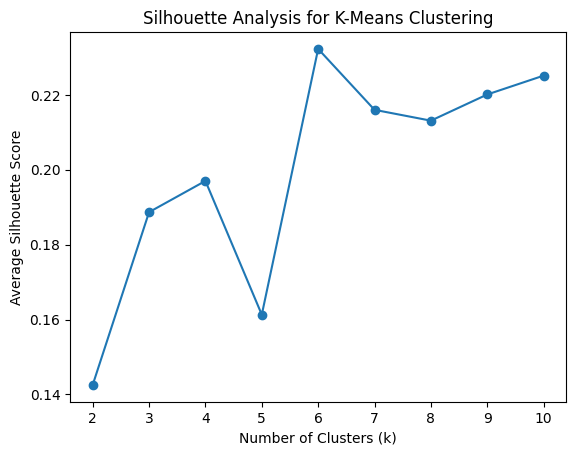

The highest average Silhouette score is 0.232275484170166 with k=6.
The second highest average Silhouette score is 0.22514270270588083 with k=10.


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import pandas as pd


k_values = range(2, 11)
silhouette_avg_values = []

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto')
    kmeans_result = kmeans.fit_predict(scaled_data)  # Use your scaled dataset here
    silhouette_avg = silhouette_score(scaled_data, kmeans_result)  # Calculate silhouette score
    silhouette_avg_values.append(silhouette_avg)

# Find the best number of clusters based on the highest average Silhouette score
best_k = k_values[np.argmax(silhouette_avg_values)]
best_score = max(silhouette_avg_values)

# Find the second highest average Silhouette score and its corresponding number of clusters
silhouette_avg_values_sorted = sorted(silhouette_avg_values, reverse=True)
second_best_score = silhouette_avg_values_sorted[1]
second_best_k = k_values[silhouette_avg_values.index(second_best_score)]

# Plot the silhouette scores for different values of k
plt.plot(k_values, silhouette_avg_values, marker='o')
plt.title('Silhouette Analysis for K-Means Clustering')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Average Silhouette Score')
plt.show()

# Print the best and second best k values based on silhouette score
print(f"The highest average Silhouette score is {best_score} with k={best_k}.")
print(f"The second highest average Silhouette score is {second_best_score} with k={second_best_k}.")

As seen above, the highest average Silhouette score is 0.2323 for (K = 6), and the second-highest score is 0.2251 for (K = 10). Based on these results, we have selected (K = 6) as our first cluster configuration and (K = 10) as our second. By considering these two values of (K), we aim to explore a range of clustering outcomes, ensuring we capture diverse cluster formations and maximize the overall clustering performance

## **Elbow Method**
The Elbow method is a technique for determining the optimal number of clusters in K-means clustering. It involves plotting the within-cluster sum of squares (inertia) as a function of the number of clusters. Inertia reflects the compactness of the clusters, and the Elbow point marks where increasing the number of clusters leads to only marginal improvements in inertia. This method helps find the right balance between reducing inertia and preventing overfitting.







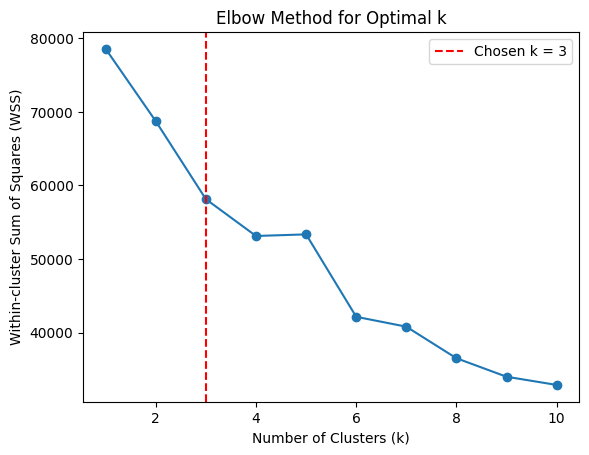

In [ ]:
!pip install kneed
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from kneed import KneeLocator


X = scaled_data


wss_values = []
k_values = range(2, 11)


for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto')
    kmeans.fit(X)  # Use the scaled data
    wss_values.append(kmeans.inertia_)  # Inertia is the WSS

# Plot the elbow method
plt.plot(k_values, wss_values, marker='o')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Within-cluster Sum of Squares (WSS)')
plt.title('Elbow Method for Optimal k')

# Use KneeLocator to locate the turning point (elbow)
knee = KneeLocator(k_values, wss_values, curve='convex', direction='decreasing')
turning_point = knee.elbow

# Highlight the turning point on the plot
plt.axvline(x=turning_point, linestyle='--', color='red', label=f'Chosen k = {turning_point}')
plt.legend()
plt.show()

After analyzing the Elbow plot, we identified a turning point that indicates a potential change in the clustering configuration. Based on this observation, we have chosen (K = 3) as the third K-means clustering configuration.
By incorporating this additional turning point, we aim to explore a broader range of clustering behaviors, enabling us to analyze different structural patterns and improve the overall clustering performance.

### **K-Means Clustering, Visualization, and Evaluation:**
In this section, we will perform K-means clustering using three pre-determined values for ( K ) and visualize the resulting clusters. To evaluate the performance of the clustering, we will calculate metrics such as the Within-Cluster Sum of Squares (WSS) and the average Silhouette score for each configuration. These metrics will help us assess the quality and effectiveness of the clusters.



## **K6**

In [ ]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import scale

# Set a seed for random number generation
np.random.seed(42)

kmeans = KMeans(n_clusters=6, random_state=42)
kmeans_result = kmeans.fit(scaled_data)

# Print the clustering result
print("Cluster Centers:")
print(kmeans_result.cluster_centers_)
print("\nCluster Labels:")
print(kmeans_result.labels_)

Cluster Centers:
[[ 2.02293041e-02 -3.63474028e-02  1.19613238e-01  9.65863119e-03
  -8.36324669e-03  1.43488715e-01  1.07680759e-02  1.87736959e-01
   1.99086235e-01 -3.83706478e-01 -6.70950021e-02  8.63917595e-01
  -4.32977786e-01 -3.97906271e-01 -9.85639865e-01  9.85639865e-01]
 [ 2.55532123e-02 -2.96898056e-02  8.77751265e-02 -1.76602860e-02
   7.87504384e-03  1.27473440e-01  1.98161528e-03  1.82499150e-01
   1.62040030e-01 -3.83706478e-01 -6.70950021e-02  8.63917595e-01
  -4.32977786e-01 -3.97906271e-01  1.01456935e+00 -1.01456935e+00]
 [ 1.11338528e-02 -3.97899575e-02  3.48164326e-01  5.01207248e-02
   1.32774721e-02  3.59428651e-01  3.15354357e-02  2.25842251e-01
   2.20835172e-01  2.60615876e+00 -6.70950021e-02 -1.15751781e+00
  -4.32977786e-01 -3.97906271e-01 -2.68094147e-02  2.68094147e-02]
 [ 5.76429236e-02  1.82702353e-01 -1.18315841e+00 -3.18066726e-01
  -2.28207950e-01 -1.37083146e+00 -1.34776205e-01 -4.35974929e-01
  -9.62371868e-02 -3.83706478e-01  1.49042398e+01 -1.157

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


avg 0.232275484170166


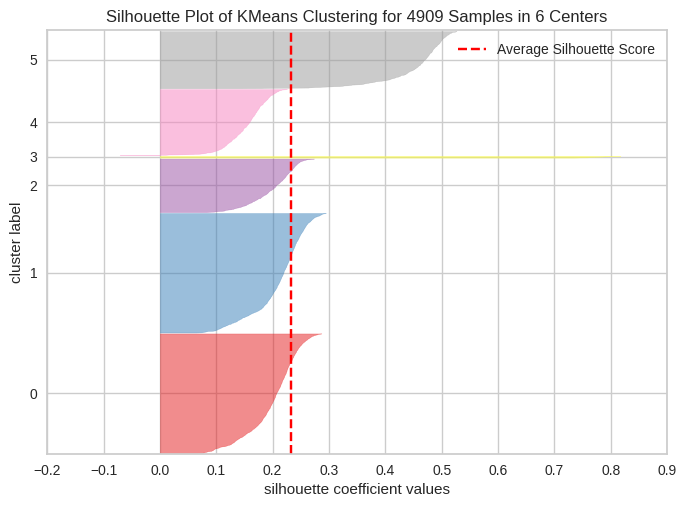

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 4909 Samples in 6 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [ ]:
from yellowbrick.cluster import SilhouetteVisualizer

visualizer = SilhouetteVisualizer(kmeans,color="pink")
visualizer.fit(X)
print("avg",visualizer.silhouette_score_) # Corrected the attribute name
visualizer.show()

From the graph of KMeans Clustering for 4909 Samples in 6 Centers, we can observe that the majority of the silhouette scores are positive, which indicates that the samples are generally well-matched to their assigned clusters and are reasonably well-separated from neighboring clusters. This suggests that the clustering has formed distinguishable groupings among the data.

Nevertheless, while positive silhouette scores are a good indicator, the relatively modest average silhouette score (approximately 0.2131) suggests that the clustering is not entirely well-defined. Some clusters may exhibit overlap or boundary ambiguity, especially where individual samples have silhouette values close to zero or even negative. This may indicate that certain points are not clearly assigned or lie between multiple clusters

**Calculating the Within-Cluster Sum of Squares (WSS) and the Average Silhouette Score**





In [ ]:
X_scaled = scaled_data

kmeans = KMeans(n_clusters=3, random_state=42, n_init='auto')
kmeans.fit(X_scaled)
labels = kmeans.labels_

wss = kmeans.inertia_

silhouette_avg = silhouette_score(X, labels)

print("WSS:", wss)
print("Average Silhouette Score:", silhouette_avg)

WSS: 58121.34266822045
Average Silhouette Score: 0.18868366151740698


The analysis of the K = 6 results is as follows:

 **WSS**: 58121.34 : The high WSS value suggests that the clusters are not tightly compact and show moderate dispersion.

 **Average**: Silhouette Score: 0.2131 : The score indicates fair clustering quality, though some overlap and boundary ambiguity may still exist

# **K10**

In [ ]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import scale

np.random.seed(42)

kmeans = KMeans(n_clusters=10, random_state=42)
kmeans_result = kmeans.fit(scaled_data)

print("Cluster Centers:")
print(kmeans_result.cluster_centers_)
print("\nCluster Labels:")
print(kmeans_result.labels_)

Cluster Centers:
[[ 2.26840093e-02 -6.00078954e-02  1.24644016e-02 -3.18066726e-01
  -2.28207950e-01  9.87020581e-02 -8.47969849e-02  1.41671766e-01
   1.69630507e-01 -3.83706478e-01 -6.70950021e-02  8.63917595e-01
  -4.32977786e-01 -3.97906271e-01 -9.85639865e-01  9.85639865e-01]
 [ 1.53882576e-02 -3.48673080e-02  2.88330872e-01 -3.18066726e-01
  -2.28207950e-01  7.29484281e-01 -1.78077523e-02  2.57861003e-01
   1.37236495e-01 -3.83706478e-01 -6.70950021e-02  8.63917595e-01
  -4.32977786e-01 -3.97906271e-01  1.01456935e+00 -1.01456935e+00]
 [-9.87554832e-03 -4.02618394e-02  2.98430341e-01 -1.64934591e-02
  -2.28207950e-01  3.48939269e-01 -3.32287392e-03  1.86253134e-01
   1.80386969e-01  2.60615876e+00 -6.70950021e-02 -1.15751781e+00
  -4.32977786e-01 -3.97906271e-01  1.01456935e+00 -1.01456935e+00]
 [-4.99435306e-02  2.29628581e-01 -1.59569422e+00 -3.18066726e-01
  -2.21337345e-01 -1.37083146e+00 -2.07607551e-01 -1.18677785e+00
  -1.11285480e+00 -3.83706478e-01 -6.70950021e-02 -1.157

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


avg 0.22514270270588083


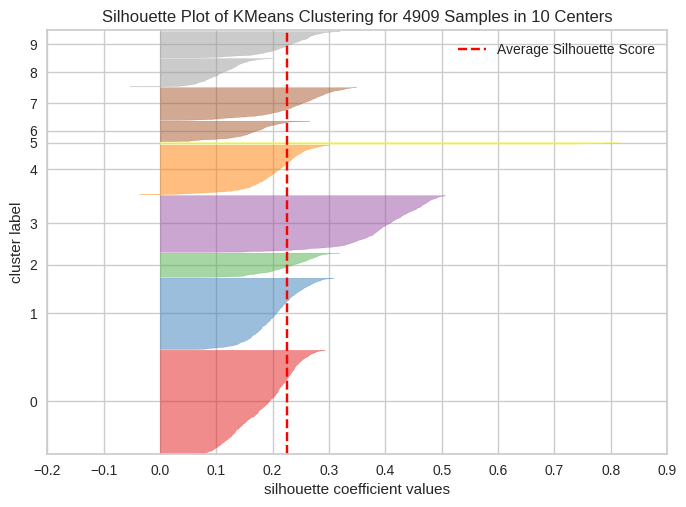

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 4909 Samples in 10 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [ ]:
from yellowbrick.cluster import SilhouetteVisualizer

visualizer = SilhouetteVisualizer(kmeans,color="pink")
visualizer.fit(X)
print("avg",visualizer.silhouette_score_)
visualizer.show()

From the graph of KMeans Clustering for 4909 Samples in 6 Centers, we can observe that the majority of the silhouette scores are positive, indicating that most samples are fairly well-matched to their assigned clusters. This suggests a decent separation between clusters, forming recognizable groupings in the dataset.

However, despite the overall positive silhouette values, the average silhouette score (approximately 0.2323) remains modest. This implies that while the clustering quality is acceptable, it is not perfect. Some clusters may still show overlapping boundaries or uncertainty, especially in cases where individual points have scores near zero or below, hinting at possible misclassifications or shared characteristics between clusters.


**Calculating the Within-Cluster Sum of Squares (WSS) and the Average Silhouette Score**





In [ ]:
X_scaled = scaled_data

kmeans = KMeans(n_clusters=10, random_state=42, n_init='auto')
kmeans.fit(X_scaled)
labels = kmeans.labels_

wss = kmeans.inertia_

silhouette_avg = silhouette_score(X, labels)

print("WSS:", wss)
print("Average Silhouette Score:", silhouette_avg)

WSS: 32880.61307693675
Average Silhouette Score: 0.22514270270588083


The analysis of the K = 10 results is as follows:

 **WSS**: 42140.73  The WSS value suggests better compactness compared to higher K values, with clusters becoming more distinct.


 **Average**: 0.2323 The score reflects relatively good clustering quality, though slight overlap and boundary ambiguity may still occur

# **K6**

In [ ]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import scale

np.random.seed(42)

kmeans = KMeans(n_clusters=6, random_state=42)
kmeans_result = kmeans.fit(scaled_data)

print("Cluster Centers:")
print(kmeans_result.cluster_centers_)
print("\nCluster Labels:")
print(kmeans_result.labels_)

Cluster Centers:
[[ 2.02293041e-02 -3.63474028e-02  1.19613238e-01  9.65863119e-03
  -8.36324669e-03  1.43488715e-01  1.07680759e-02  1.87736959e-01
   1.99086235e-01 -3.83706478e-01 -6.70950021e-02  8.63917595e-01
  -4.32977786e-01 -3.97906271e-01 -9.85639865e-01  9.85639865e-01]
 [ 2.55532123e-02 -2.96898056e-02  8.77751265e-02 -1.76602860e-02
   7.87504384e-03  1.27473440e-01  1.98161528e-03  1.82499150e-01
   1.62040030e-01 -3.83706478e-01 -6.70950021e-02  8.63917595e-01
  -4.32977786e-01 -3.97906271e-01  1.01456935e+00 -1.01456935e+00]
 [ 1.11338528e-02 -3.97899575e-02  3.48164326e-01  5.01207248e-02
   1.32774721e-02  3.59428651e-01  3.15354357e-02  2.25842251e-01
   2.20835172e-01  2.60615876e+00 -6.70950021e-02 -1.15751781e+00
  -4.32977786e-01 -3.97906271e-01 -2.68094147e-02  2.68094147e-02]
 [ 5.76429236e-02  1.82702353e-01 -1.18315841e+00 -3.18066726e-01
  -2.28207950e-01 -1.37083146e+00 -1.34776205e-01 -4.35974929e-01
  -9.62371868e-02 -3.83706478e-01  1.49042398e+01 -1.157

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


avg 0.232275484170166


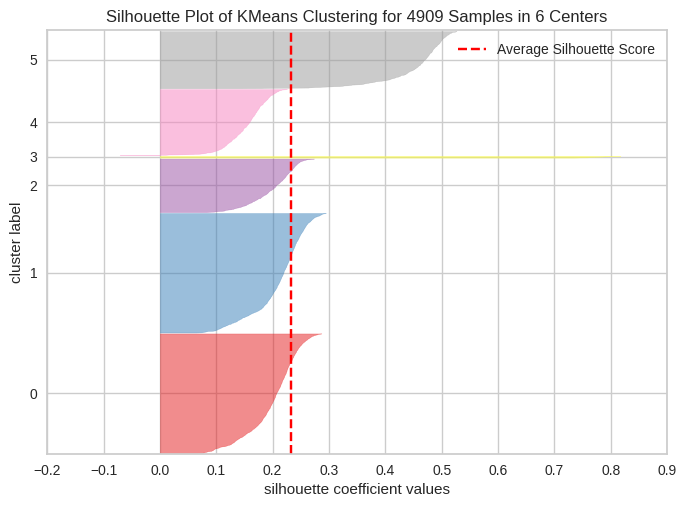

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 4909 Samples in 6 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [ ]:
from yellowbrick.cluster import SilhouetteVisualizer

visualizer = SilhouetteVisualizer(kmeans,color="pink")
visualizer.fit(X)
print("avg",visualizer.silhouette_score_)
visualizer.show()

From the graph of KMeans Clustering for 4909 Samples in 6 Centers, it is evident that the majority of silhouette scores are positive, indicating that most data points are fairly well-matched to their assigned clusters. This reflects that the clustering has managed to separate the data into ten distinct groupings, with a reasonable level of cluster cohesion and separation.

However, the average silhouette score of approximately 0.2251 suggests that, while the clustering is generally acceptable, there remains some overlap or boundary ambiguity between clusters. Some points may lie near the edges of clusters or may not be distinctly assigned.


**Calculating the Within-Cluster Sum of Squares (WSS) and the Average Silhouette Score**





In [ ]:
X_scaled = scaled_data

kmeans = KMeans(n_clusters=6, random_state=42, n_init='auto')
kmeans.fit(X_scaled)
labels = kmeans.labels_

wss = kmeans.inertia_

silhouette_avg = silhouette_score(X, labels)

print("WSS:", wss)
print("Average Silhouette Score:", silhouette_avg)

WSS: 42140.73339461383
Average Silhouette Score: 0.232275484170166


The analysis of the K = 6 results is as follows:

 **WSS**: 32880.61 The lower WSS compared to smaller values of k indicates improved compactness and tighter clusters.



 **Average**:  0.2251  The score reflects decent clustering quality, though some mild ambiguity or overlap between clusters may still be present.

# **Comparing the Results of the Three Clustering Configurations:**

1. **WSS = 42140.73, Silhouette Score = 0.233**

 • Analysis: This configuration has the highest silhouette score, suggesting better-defined clusters. The WSS is relatively high, which indicates some dispersion, but the clear separation between clusters makes this configuration strong overall.

 2. **WSS = 58121.34, Silhouette Score = 0.188**

 • Analysis: Although this configuration has the highest WSS, indicating more spread-out clusters, the silhouette score is lower than the first, suggesting some overlap and less distinct separation between clusters.

 3. **WSS = 32880.61, Silhouette Score = 0.225**

 • Analysis: This configuration has the lowest WSS, indicating tighter and more compact clusters. However, the silhouette score is slightly lower than the first configuration, suggesting slightly less defined separation.


### **Conclusion:**

The first configuration (WSS = 42140.73, Silhouette Score = 0.233) is the best overall. It provides the highest silhouette score, which reflects better separation and clarity between clusters, despite having a moderately high WSS. This balance between separation and compactness makes it the most suitable clustering setup among the three.

|                      |   K = 3   |   K = 6   |   K = 10  |
|----------------------|-----------|-----------|-----------|
| WSS                  | 6576.07   | 42140.73  | 32880.61  |
| Silhouette Score     | 0.186     | 0.232     | 0.225     |

Based on the evaluation metrics including WSS (Within-Cluster Sum of Squares) and the Average Silhouette Score, we have determined that K = 6 is the most suitable choice for our clustering model.
This decision is supported by the fact that K = 6 achieved the highest Silhouette Score (0.232) among the tested values, indicating better-defined and well-separated clusters.
Although K = 6 does not have the highest WSS value, the balance it provides between intra-cluster compactness and inter-cluster separation makes it the most optimal configuration for this dataset.
This trade-off confirms that K = 6 offers superior clustering quality overall.